# Working with CGX data using MNE
The goal of this notebook is to import data saved using the [CGX data collection software](http://cognionics.com/wiki/pmwiki.php/Main/DataAcquisitionSoftware), and run through some pre-processing steps using [MNE-Python](https://mne.tools/stable/index.html)!

In [1]:
import mne
import matplotlib.pyplot as plt

## Path to dataset

This example's dataset was saved using the .bdf format. 

We could also use CGX's .txt output, or some of the other formats supported by the CGX's data acquisition software.

In [2]:
DATA_PATH = r'/Users/3x10e8/Documents/GitHub/ac23-eeg/DATA/'
DATA_PATH += r'Shashank/motor_response_car_game_shashank_karan_baseline_active_playing.vhdr'
# print(len(DATA_PATH))

We can import this dataset following the instructions here:
https://mne.tools/stable/auto_tutorials/io/20_reading_eeg_data.html

Format | Function
:-- | :--
.eeg, .vhdr, .vhdk | [mne.io.read_raw_brainvision](https://mne.tools/stable/generated/mne.io.read_raw_brainvision.html#mne.io.read_raw_brainvision)
.bdf | [mne.io.read_raw_bdf](https://mne.tools/stable/generated/mne.io.read_raw_bdf.html)

In [3]:
eog_chans = ['ExG 1', 'ExG 2']
misc_chans = ['ACC32', 'ACC33', 'ACC34', 'Packet Counter']
stim_chan = ['TRIGGER']
exclude_chans = ['A2']

if '.bdf' in DATA_PATH:
    print('Reading .bdf file...')
    raw = mne.io.read_raw_bdf(
        DATA_PATH,
        eog = eog_chans, # in case these were used as EMG channels, just to separate from EEG channels
        misc = misc_chans, # keeping aside these as units would be different
        stim_channel = stim_chan, # should get the triggers streamed from the trigger box (if used), not LSL
        exclude = exclude_chans, # assuming only one ground reference was used
        preload = True, # load data to memory
    )
    
elif '.vhdr' in DATA_PATH:
    print('Reading .vhdr file...')
    # Move stim and exclude channels to misc to de-clutter usable EEG channels
    # Note annotations get imported from the markers file directly, so we don't need a separate stim channel
    misc_chans.extend(stim_chan) 
    misc_chans.extend(exclude_chans) 
    
    raw = mne.io.read_raw_brainvision(
        vhdr_fname=DATA_PATH,
        eog = eog_chans, # in case these were used as EMG channels, just to separate from EEG channels
        misc = misc_chans, # keeping aside these as units would be different
        #stim_channel = not needed, marker file should be separate
        #exclude = exclude_chans, # assuming only one ground reference was used
        preload = True, # load data to memory
    )

elif '.txt' in DATA_PATH:
    pass # add pandas code and make a raw_io object for CGX software's txt formatting

raw.info

Reading .vhdr file...
Extracting parameters from /Users/3x10e8/Documents/GitHub/ac23-eeg/DATA/Shashank/motor_response_car_game_shashank_karan_baseline_active_playing.vhdr...
Setting channel info structure...
Reading 0 ... 36373  =      0.000 ...    72.746 secs...


<Info | 7 non-empty values
 bads: []
 ch_names: AF7, Fpz, F7, Fz, T7, FC6, Fp1, F4, C4, Oz, CP6, Cz, PO8, CP5, ...
 chs: 29 EEG, 6 misc, 2 EOG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 37
 projs: []
 sfreq: 500.0 Hz
>

In [4]:
raw[0] # the 0th channels raw data and corresponding time arrayy, could be useful to figure out units

(array([[-0.02090679, -0.02091195, -0.02091094, ..., -0.0214211 ,
         -0.02140997, -0.02140085]]),
 array([0.0000e+00, 2.0000e-03, 4.0000e-03, ..., 7.2742e+01, 7.2744e+01,
        7.2746e+01]))

In [5]:
# Printing all channel names for reference
for ch in raw.info.ch_names:
    print(ch)

AF7
Fpz
F7
Fz
T7
FC6
Fp1
F4
C4
Oz
CP6
Cz
PO8
CP5
O2
O1
P3
P4
P7
P8
Pz
PO7
T8
C3
Fp2
F3
F8
FC5
AF8
A2
ExG 1
ExG 2
ACC32
ACC33
ACC34
Packet Counter
TRIGGER


## Apply the 10-20 channel montage

/var/folders/st/wjnxghxn7_b382gv3l4lxt0m0000gn/T/ipykernel_47360/3578104422.py:1: RuntimeWarning: Not setting position of 1 misc channel found in montage:
['A2']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw.info.set_montage('standard_1020', match_case=False)


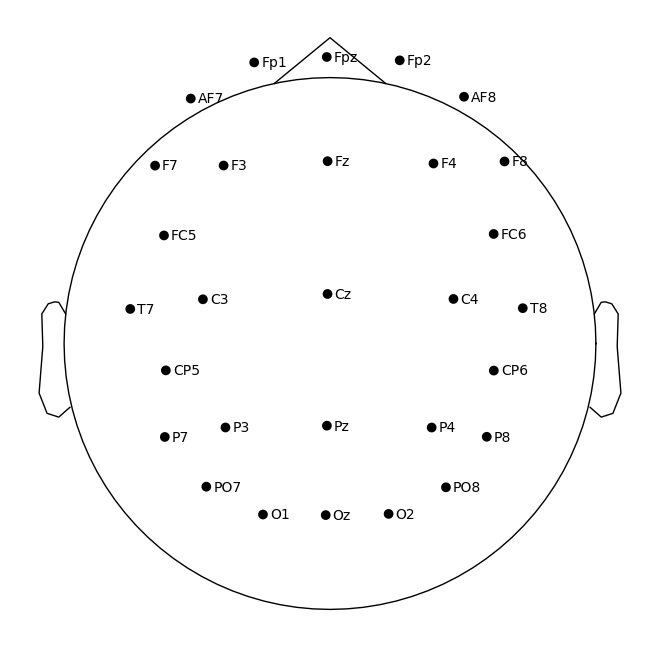

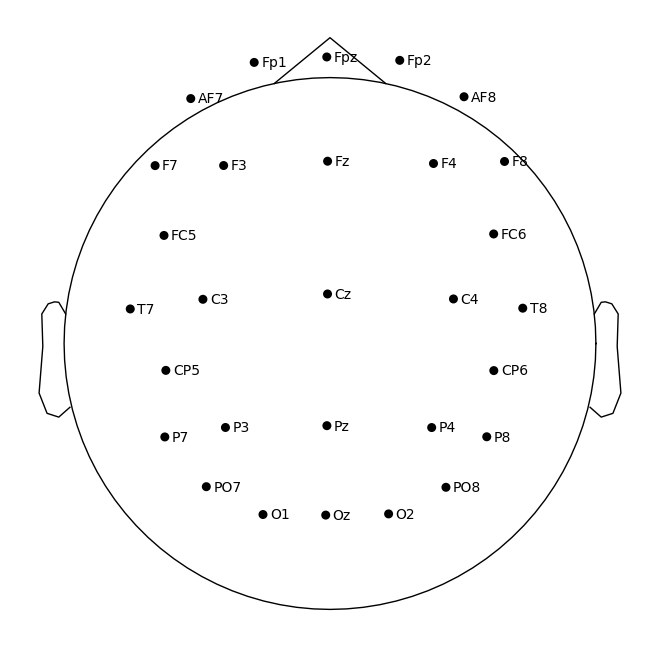

In [6]:
raw.info.set_montage('standard_1020', match_case=False)

# Plot the montage
mne.viz.plot_montage(raw.info.get_montage())

Using matplotlib as 2D backend.


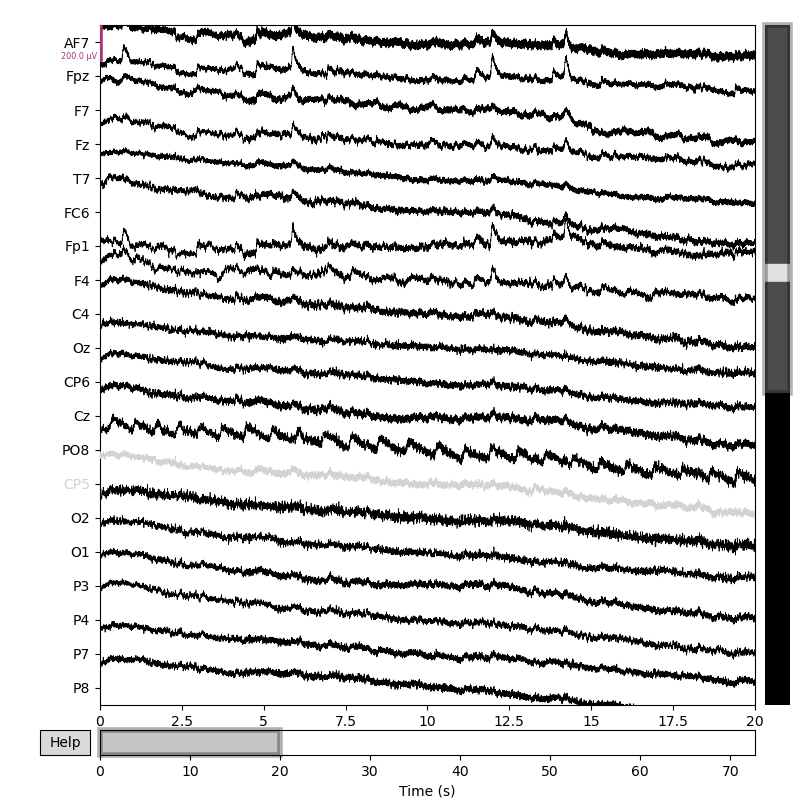

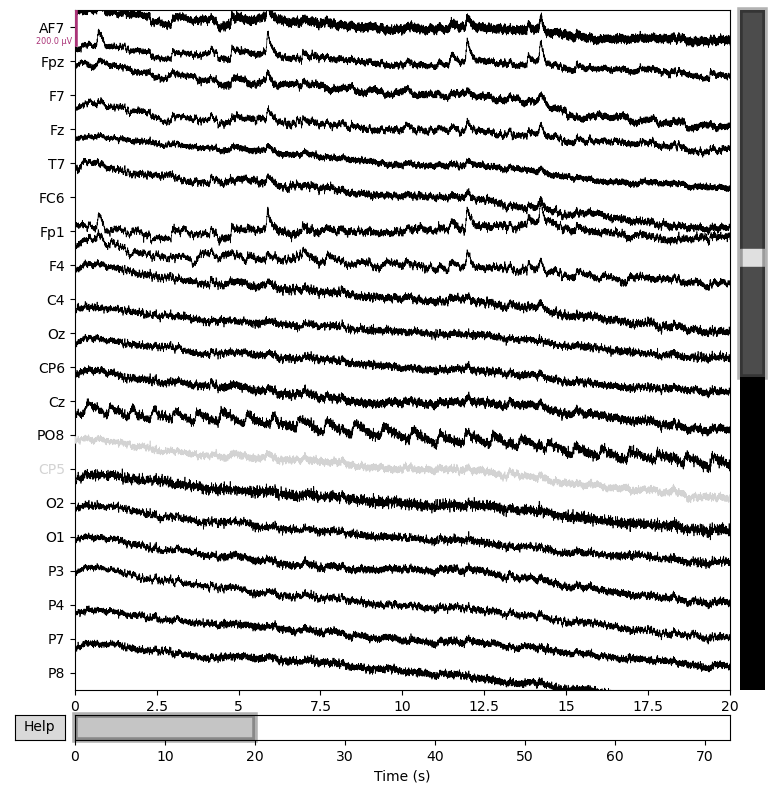

In [7]:
%matplotlib widget

# could go back to 
# %matplotlib inline 
# if the plot doubling becomes annoying

# using widget to make the plot interactive (for scrolling, bad channel selection, etc)

# scaling can help with visibility, especially if we have some bad channels / artifacts
scalings = {
    'eeg': 100e-6, 
    'eog': 500e-6,
    'misc': 100
} 

# In case you want to manually flag some channels as bad (could also click in the plot)
bad_chans = ['CP5']
raw.info['bads'] = bad_chans

PLOT_WINDOW_START_s = 0
PLOT_WINDOW_DUR_s = 20

raw.plot(
    scalings = scalings,
    #butterfly = True,
    start = PLOT_WINDOW_START_s,
    duration = PLOT_WINDOW_DUR_s,
)

Let's look at a power spectrum (before we do any filtering):

Effective window size : 2.048 (s)


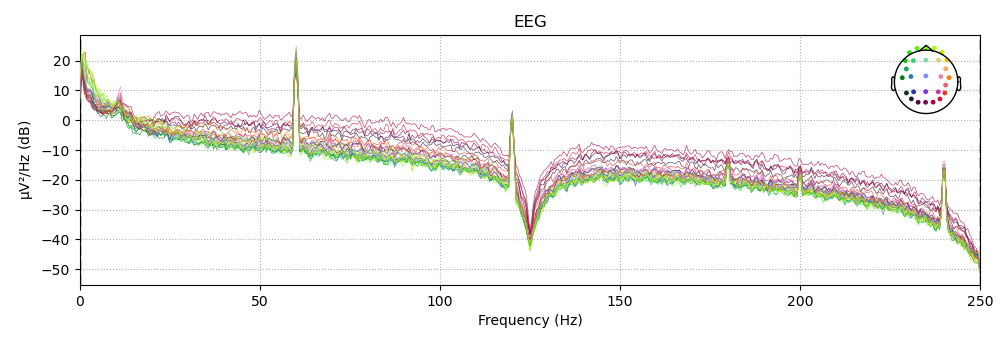

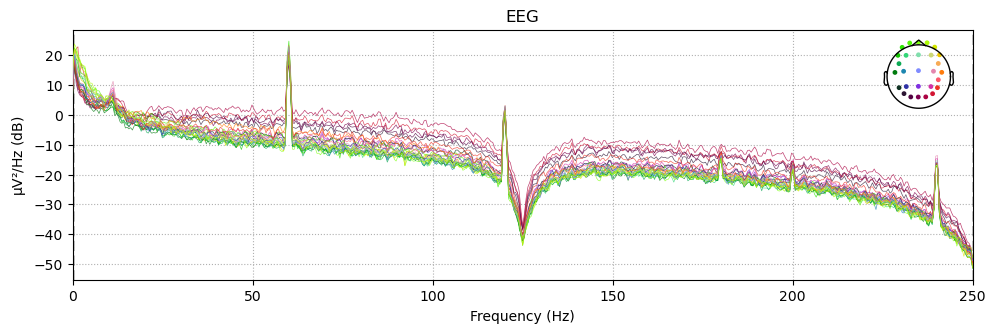

In [8]:
raw.compute_psd(n_fft = 1024).plot(average = False)

Let's bandpass filter the data:

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 16501 samples (33.002 sec)

Effective window size : 2.048 (s)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  29 out of  29 | elapsed:    0.1s finished


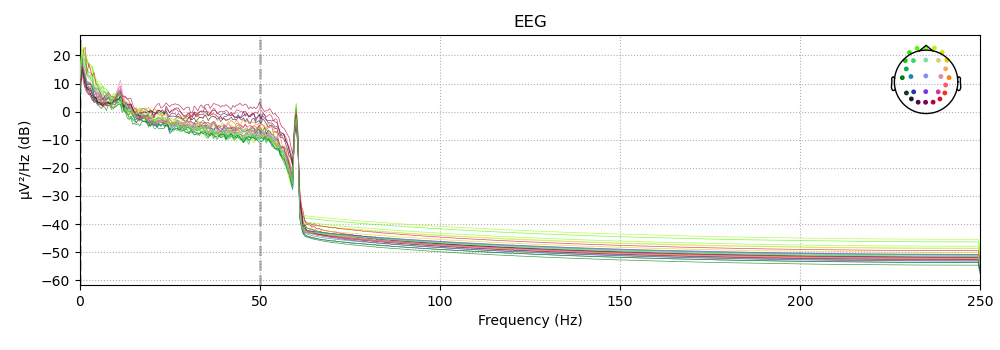

Effective window size : 2.048 (s)


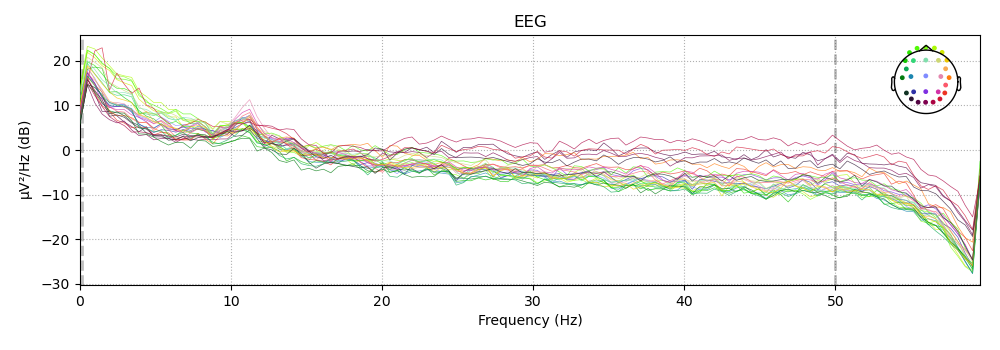

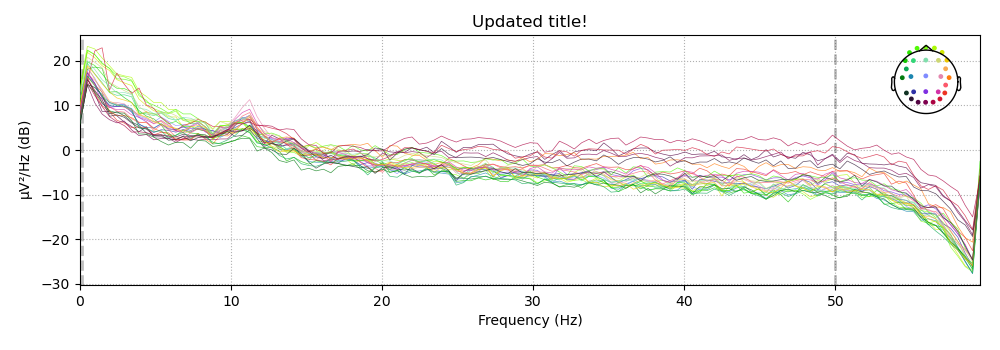

In [9]:
raw_filt = raw.copy().filter( # make a copy of the array to avoid modifying in place
    l_freq = 0.1, # lower cut-off, in Hz
    h_freq = 50, # upper cut-off, in Hz
)

# And look at the PSD again
raw_filt.compute_psd(n_fft = 1024).plot(average = False)

n_fft = 1024

# picks = [''] # a list of channels that you want to focus on, if any
fig = raw_filt.compute_psd(
    # picks= picks,
    fmin = 0, # lower limit to plot
    fmax = 60, # upper limit to plot
    # tmin = 0, # if only using a subset of the data for PSD computation
    # tmax = 10,
    n_fft = n_fft,
).plot()

# Some reformatting if needed
# fig.get_axes()[0].set_ylim(YLIM_MIN, YLIM_MAX)
fig.get_axes()[0].set_title('Updated title!')
plt.show()

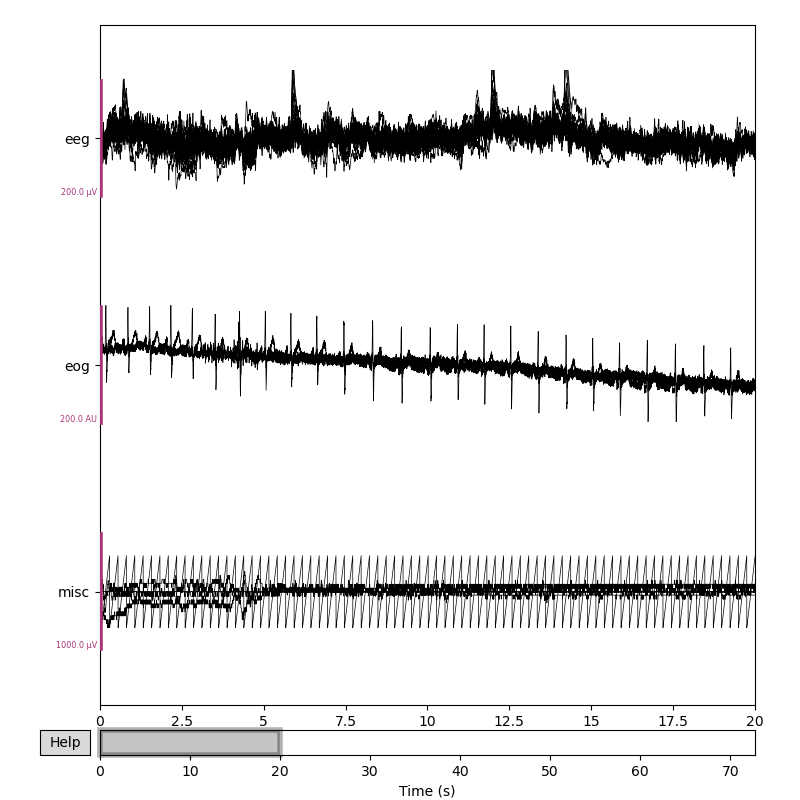

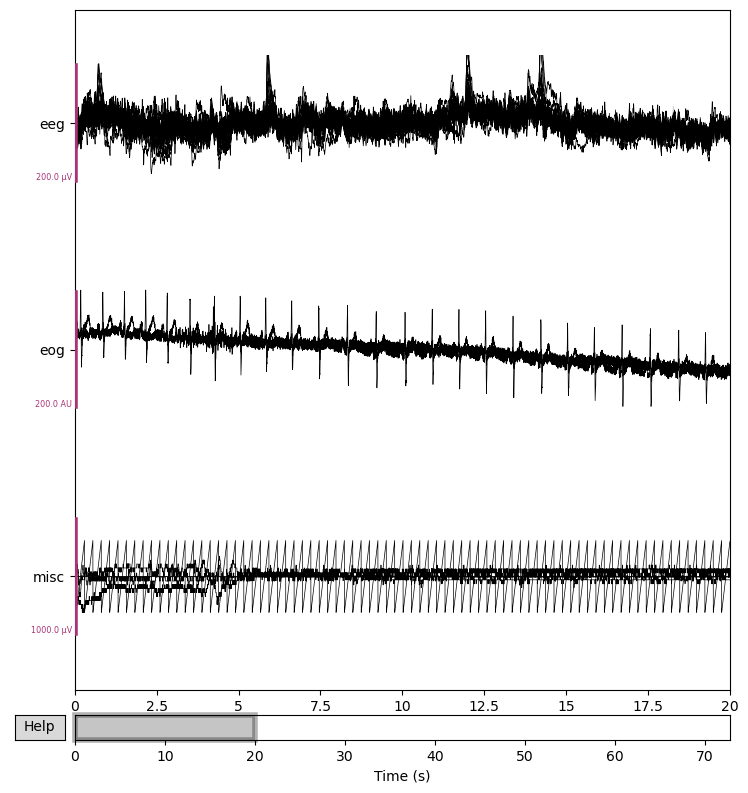

In [10]:
## Update scalings if needed
# scalings['eeg'] = 200e-6 
scalings['eog'] = 500e-6
# scalings['misc'] = 100

raw_filt.info.bads = [] #'Oz', 'PO8', 'Fp2', 'F7', 'P3'] # ideally could label bad segments instead of dropping channels

# Drop bad channels from visual examination before running ICA
raw_filt_drop_bad = raw_filt.copy().drop_channels(raw_filt.info.bads)

raw_filt_drop_bad.plot(
    scalings = scalings,
    butterfly = True,
    start = PLOT_WINDOW_START_s,
    duration = PLOT_WINDOW_DUR_s,
)

## Re-reference to average
https://mne.tools/stable/generated/mne.set_eeg_reference.html

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


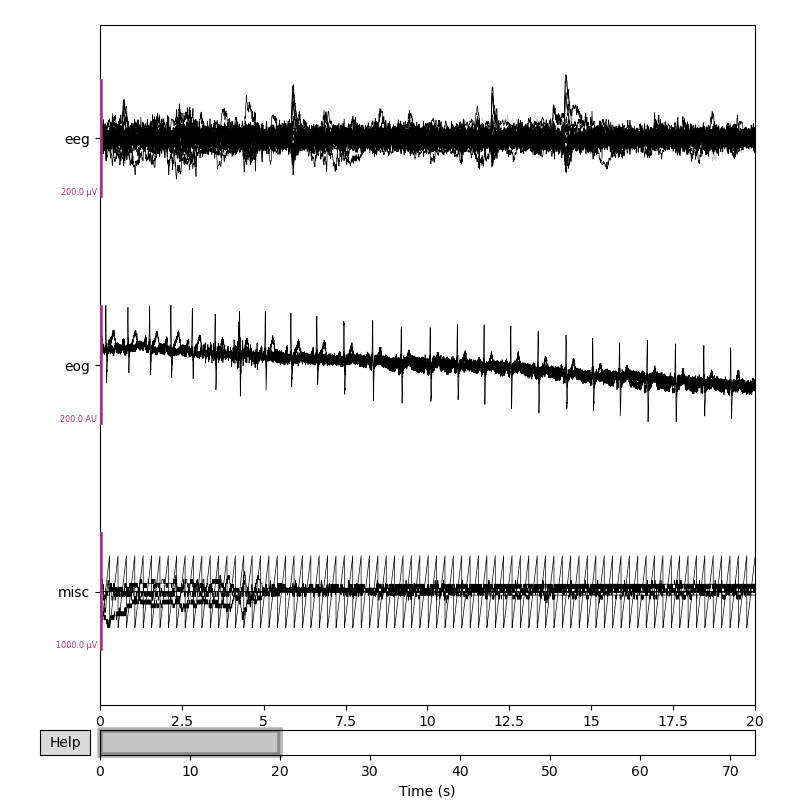

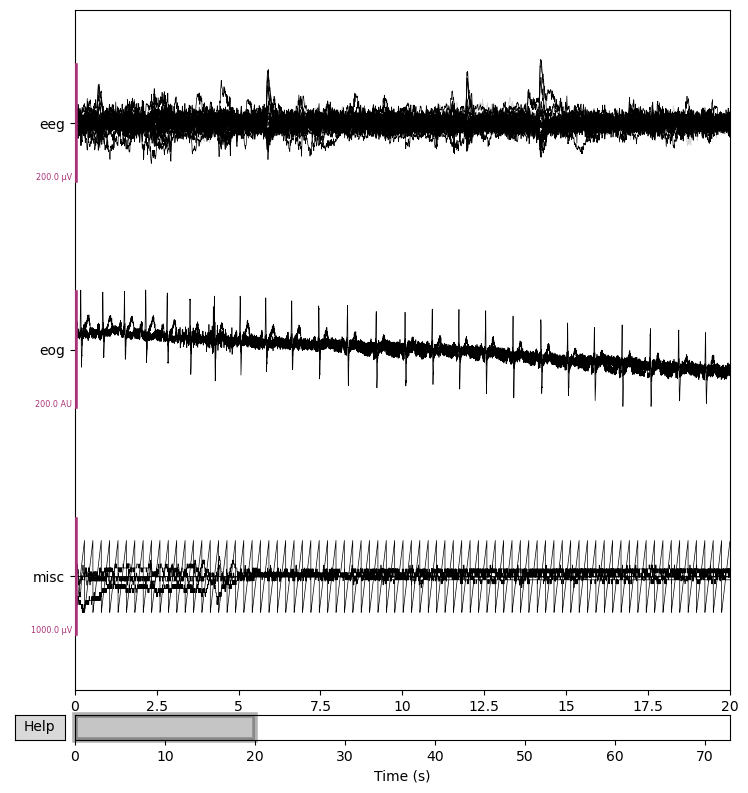

In [11]:
raw_filt_drop_bad_rref, _ = mne.set_eeg_reference(
    raw_filt_drop_bad, 
    ref_channels='average',
)

raw_filt_drop_bad_rref.plot(
    scalings=scalings,
    butterfly=True,
    start = PLOT_WINDOW_START_s,
    duration = PLOT_WINDOW_DUR_s,
)

# Run ICA to remove artifacts
https://mne.tools/stable/auto_tutorials/preprocessing/40_artifact_correction_ica.html#sphx-glr-auto-tutorials-preprocessing-40-artifact-correction-ica-py

In [12]:
from mne.preprocessing import ICA

# Make an ICA object
ica = ICA(
    #n_components = 29, # number of prinicipal components passed to ICA
    random_state = 23, # seed for numpy RNG
    #method = 'infomax', # can use 'fastica' or 'picard' too
)

# Run ICA
ica.fit(raw_filt_drop_bad_rref)

Fitting ICA to data using 28 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 27 components
Fitting ICA took 16.1s.


/opt/anaconda3/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:116: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Method,fastica
Fit,1000 iterations on raw data (36374 samples)
ICA components,27
Available PCA components,28
Channel types,eeg
ICA components marked for exclusion,—


## Plot ICA components over time

Creating RawArray with float64 data, n_channels=29, n_times=36374
    Range : 0 ... 36373 =      0.000 ...    72.746 secs
Ready.


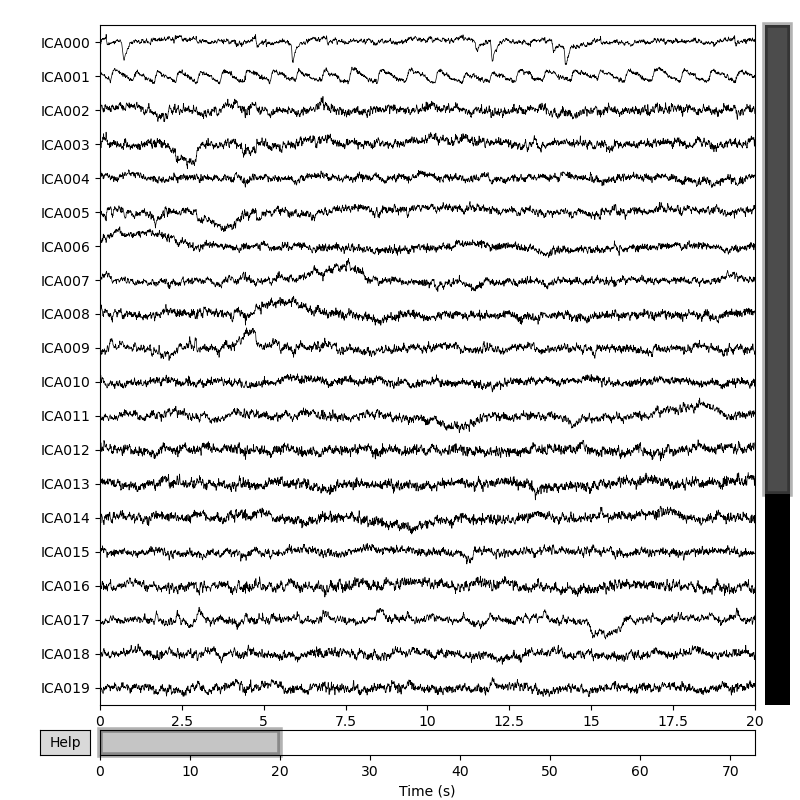

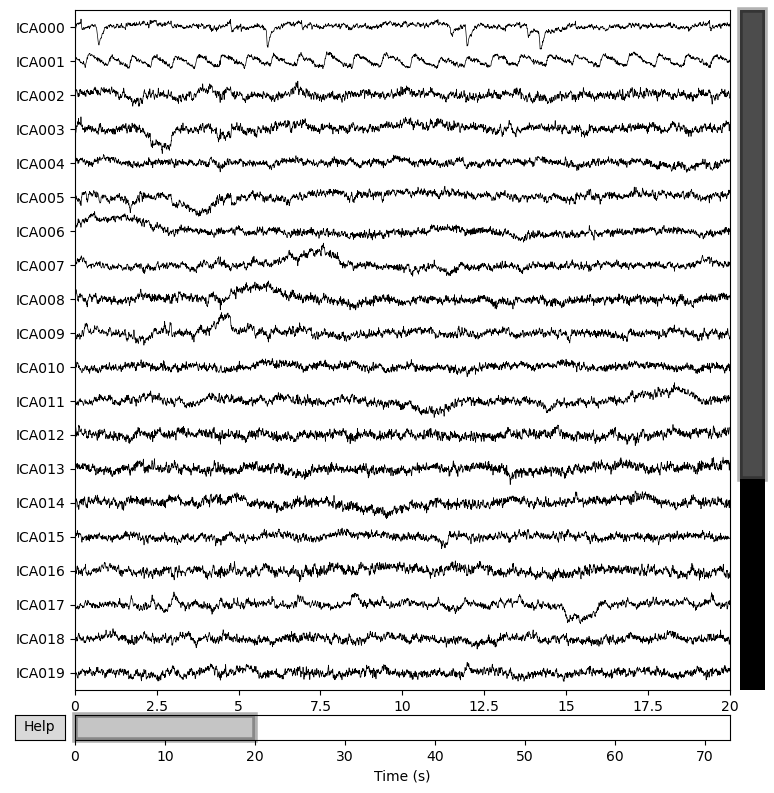

In [13]:
%matplotlib widget
ica.plot_sources(
    raw_filt_drop_bad_rref,
    start = PLOT_WINDOW_START_s,
    stop = PLOT_WINDOW_START_s + PLOT_WINDOW_DUR_s,
)

## Topomaps for each ICA component

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
36 matching events found
No baseline correction applied
0 projection i

/opt/anaconda3/lib/python3.9/site-packages/mne/viz/ica.py:129: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated


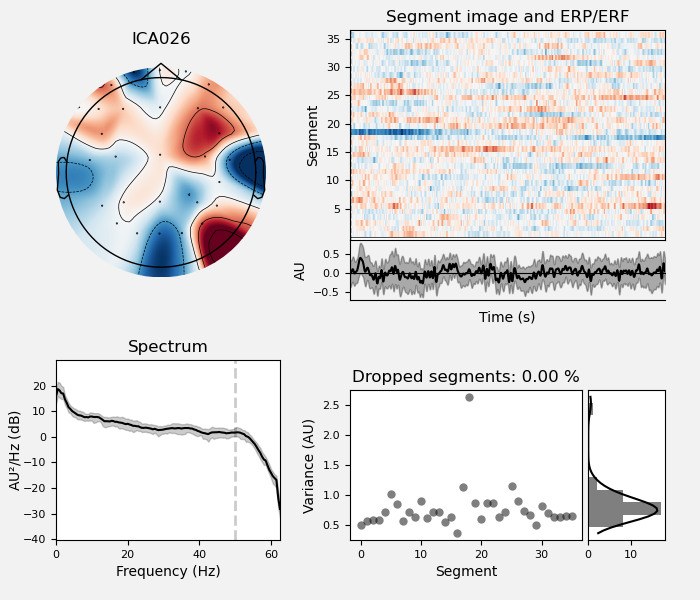

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

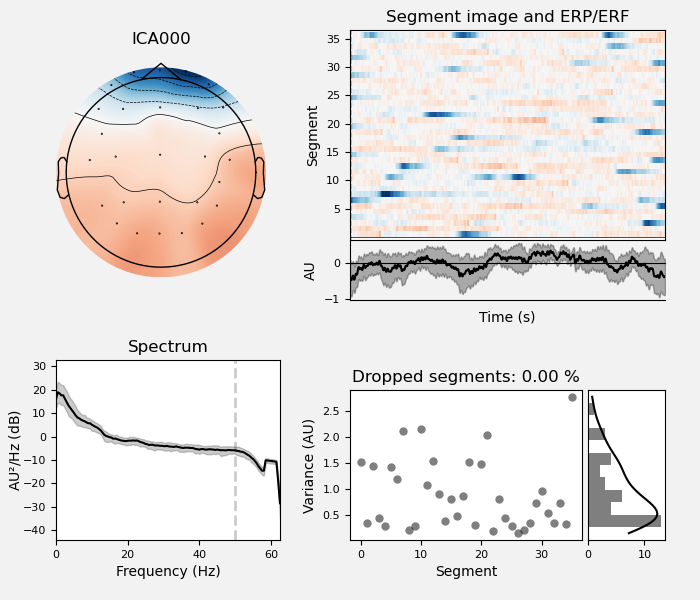

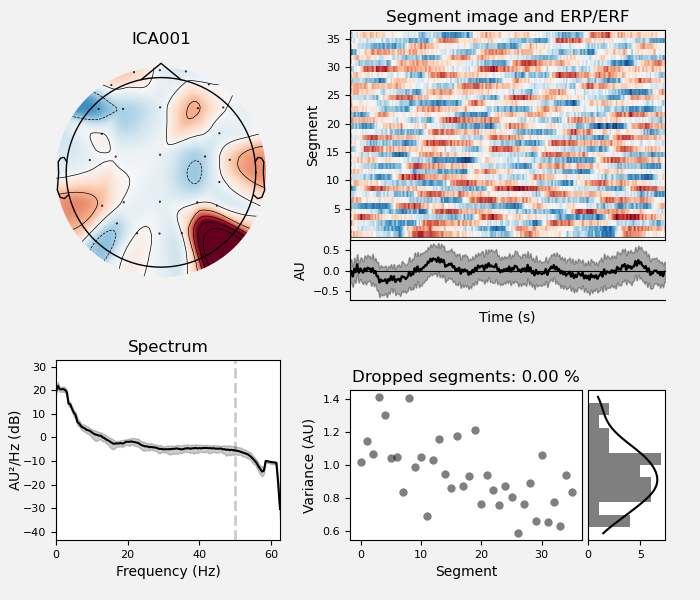

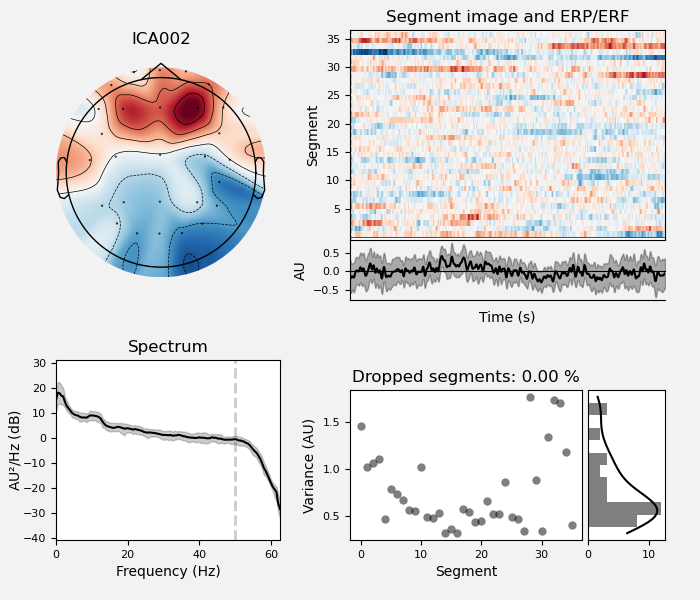

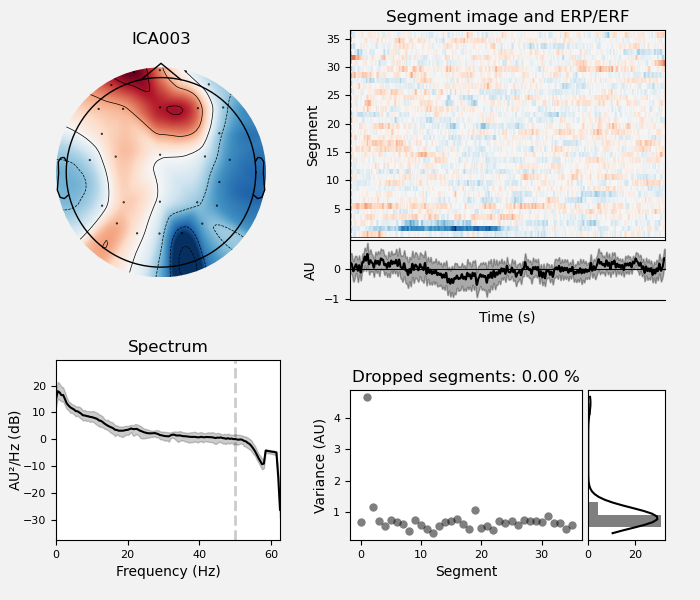

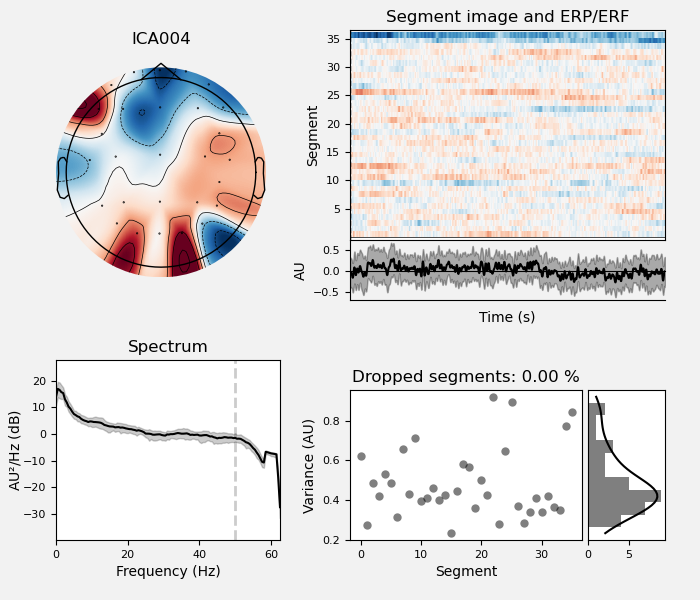

...

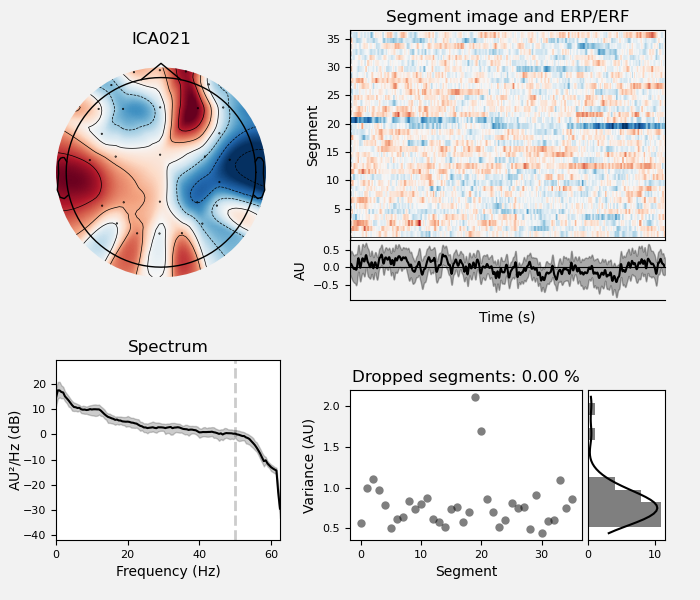

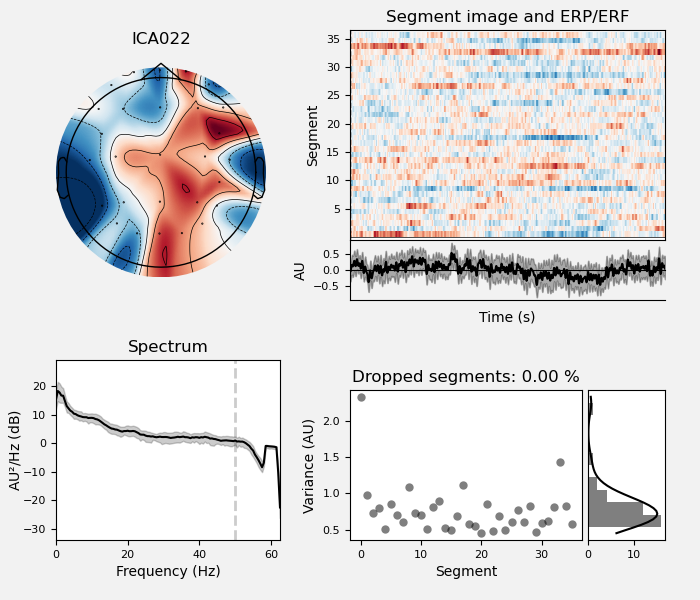

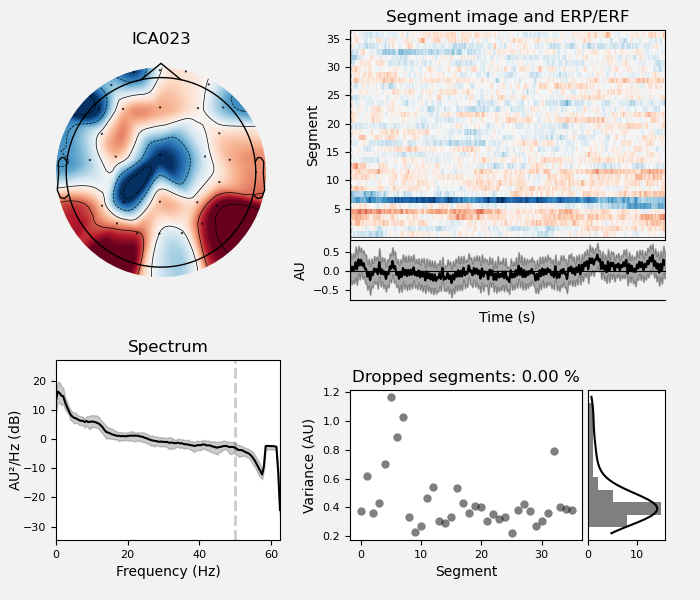

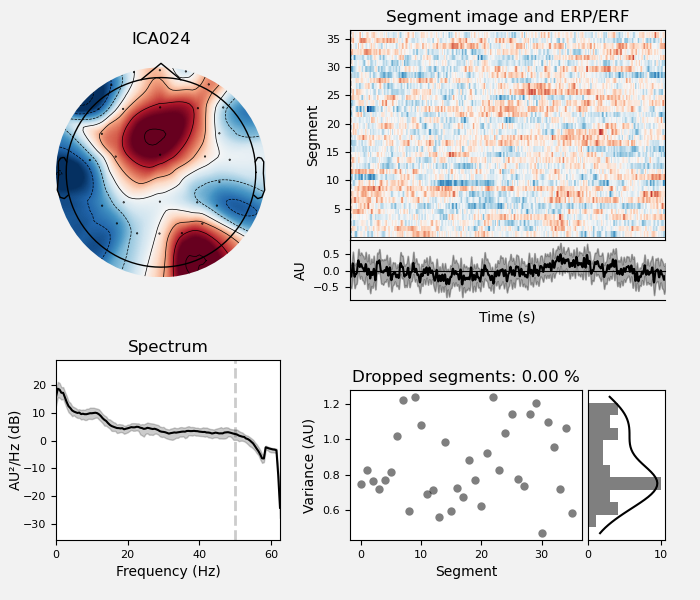

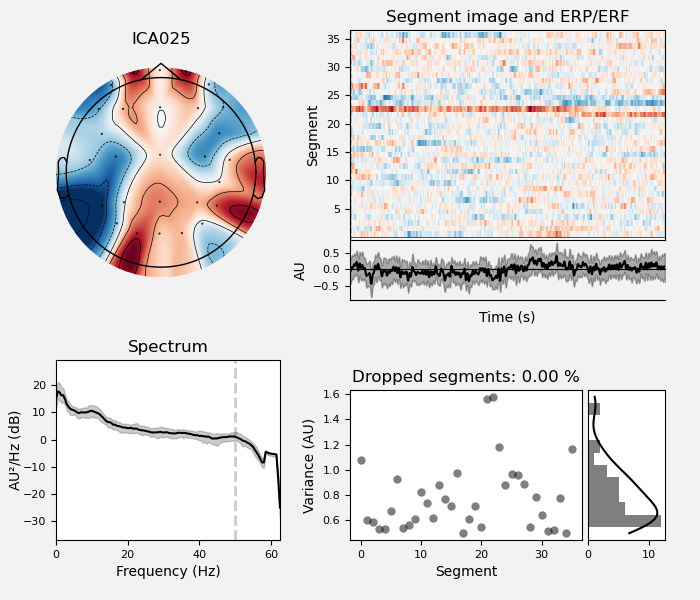

In [14]:
ica.plot_properties(
    raw_filt_drop_bad_rref,
    picks = range(ica.n_components_) # select ICA components to plot topomaps for
)

## Remove suspect ICA components

Applying ICA to Raw instance
    Transforming to ICA space (27 components)
    Zeroing out 2 ICA components
    Projecting back using 28 PCA components


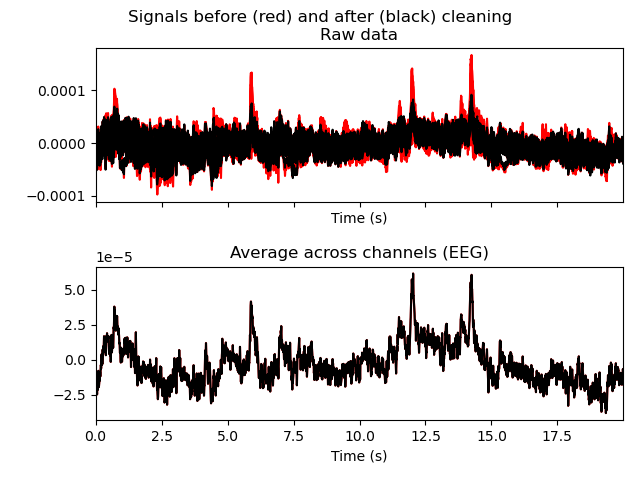

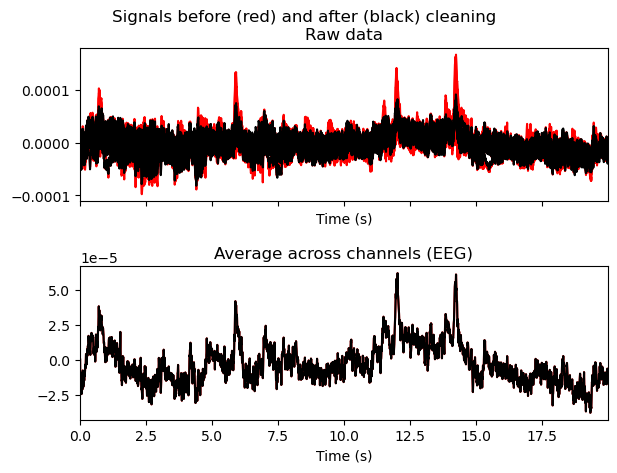

In [15]:
suspect_ica_components = [
    0, # eye blinks
    1, # pulse
]

ica.plot_overlay(
    raw_filt_drop_bad,
    exclude = suspect_ica_components,
    
    start = int(raw_filt_drop_bad.info['sfreq']) * PLOT_WINDOW_START_s, # this is index, not seconds
    stop = int(raw_filt_drop_bad.info['sfreq']) * (PLOT_WINDOW_START_s + PLOT_WINDOW_DUR_s),
)


## Project back to channel space

In [16]:
raw_ica = ica.apply(
    raw_filt_drop_bad, 
    exclude=suspect_ica_components, # ICA components to drop
)

Applying ICA to Raw instance
    Transforming to ICA space (27 components)
    Zeroing out 2 ICA components
    Projecting back using 28 PCA components


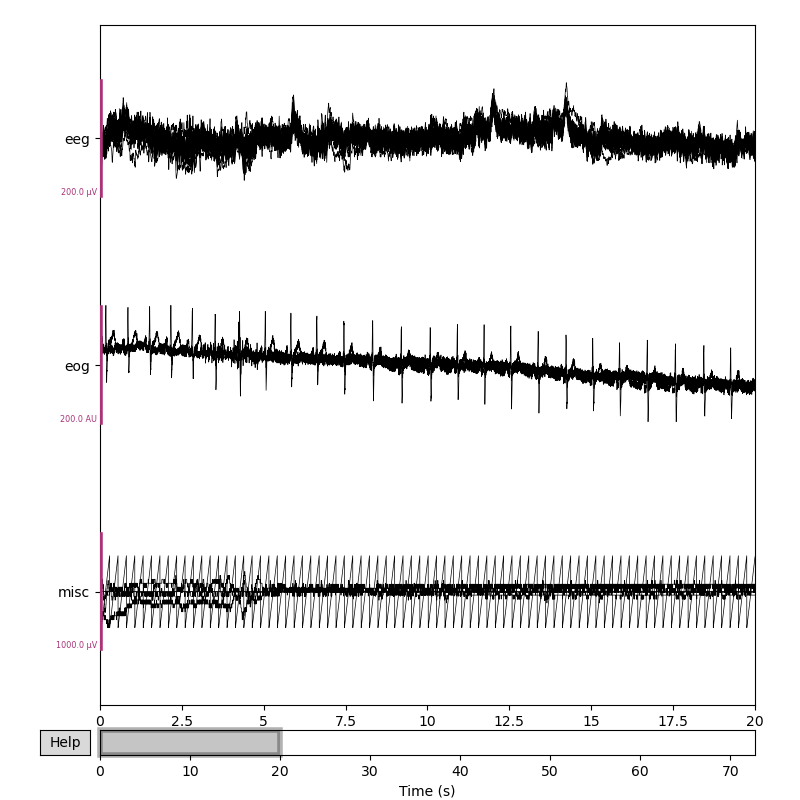

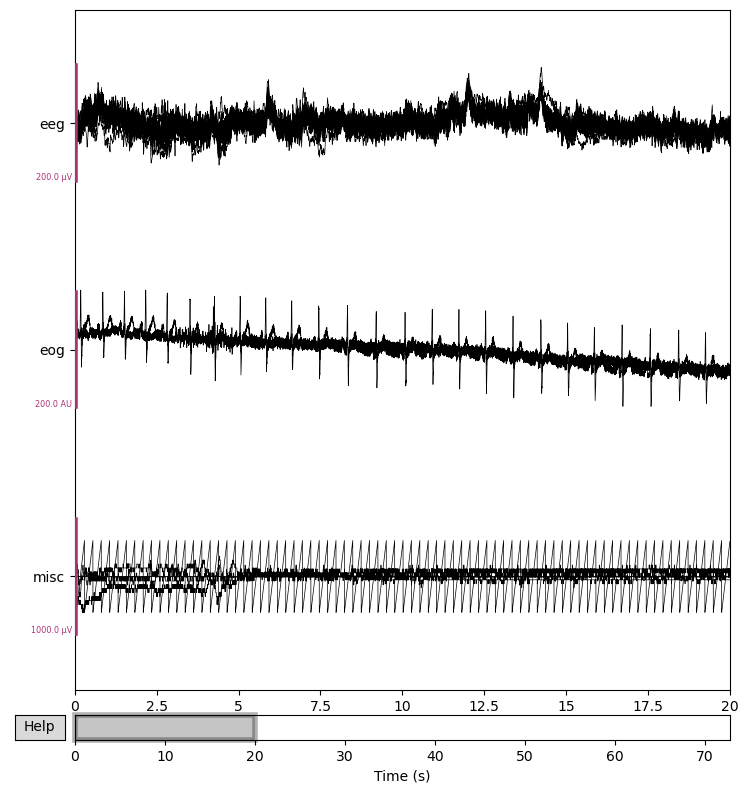

In [17]:
raw_ica.plot(
    scalings = scalings,
    butterfly = True,
    duration = PLOT_WINDOW_DUR_s,
    start = PLOT_WINDOW_START_s,
)

# Lets find events from the trigger channel

In [18]:
events = mne.events_from_annotations(raw_ica)

In [19]:
events

(array([], shape=(0, 3), dtype=int64), {})

In [20]:
event_id

NameError: name 'event_id' is not defined

In [ ]:
eps = mne.Epochs(
    #raw_filt,
    raw_ica,
    events = events, 
    event_id = event_id, 
    tmin=-0.5,
    tmax=1.5,
    baseline=None,
)

%matplotlib inline

for ev_id in event_id:
    eps[ev_id].plot_image(
        #picks = [],
        combine='mean'
    )

In [ ]:
for ev_id in event_id:
    eps[ev_id].average(
        # picks = []
    ).plot_joint()